In [0]:
from pyspark.sql.types import StructType, StructField, IntegerType, StringType, BooleanType, DateType, DecimalType
from pyspark.sql.functions import col, when, sum, avg, row_number
from pyspark.sql.window import Window

In [0]:
# creating sparksession 
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName('IPL Data Analysis').getOrCreate()

spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
# creating schema for 'Ball_By_Ball.csv' using ChatGPT. Otherwise spark is taking all the wrong schema. 
ball_by_ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),
    StructField("legbyes", IntegerType(), True),
    StructField("byes", IntegerType(), True),
    StructField("noballs", IntegerType(), True),
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", BooleanType(), True),
    StructField("bowled", BooleanType(), True),
    StructField("run_out", BooleanType(), True),
    StructField("lbw", BooleanType(), True),
    StructField("retired_hurt", BooleanType(), True),
    StructField("stumped", BooleanType(), True),
    StructField("caught_and_bowled", BooleanType(), True),
    StructField("hit_wicket", BooleanType(), True),
    StructField("obstructingfeild", BooleanType(), True),
    StructField("bowler_wicket", BooleanType(), True),
    StructField("match_date", DateType(), True),
    StructField("season", IntegerType(), True),
    StructField("striker", IntegerType(), True),
    StructField("non_striker", IntegerType(), True),
    StructField("bowler", IntegerType(), True),
    StructField("player_out", IntegerType(), True),
    StructField("fielders", IntegerType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", BooleanType(), True),
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", DateType(), True)
])

# Here I am getting all are string. If I do 'inferSchema' also then I will get 'integer' for some boolean columns, and that is not correct
# That is why we are defining the schema's above by 'ball_by_ball_schema'

In [0]:
#loading the file using DBFS path
ball_by_ball_df = spark.read.format('csv').schema(ball_by_ball_schema).option('header', True).load('dbfs:/FileStore/tables/DE_Projects/IPL Data Analysis/Ball_By_Ball.csv')


In [0]:
#checking the file is properly loaded or not
# ball_by_ball_df.show(5)
# display(ball_by_ball_df)
# ball_by_ball_df.printSchema()

# commented this as dont need this for the project. Only for understanding purpose

In [0]:
#same for the match_schema 
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("match_date", DateType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("venue_name", StringType(), True),
    StructField("city_name", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("match_winner", StringType(), True),
    StructField("toss_name", StringType(), True),
    StructField("win_type", StringType(), True),
    StructField("outcome_type", StringType(), True),
    StructField("manofmach", StringType(), True),
    StructField("win_margin", IntegerType(), True),
    StructField("country_id", IntegerType(), True)
])
match_df = spark.read.schema(match_schema).format("csv").option("header","true").load("dbfs:/FileStore/tables/DE_Projects/IPL Data Analysis/Match.csv")
     

In [0]:
player_schema = StructType([
    StructField("player_sk", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True)
])

player_df = spark.read.schema(player_schema).format("csv").option("header","true").load("dbfs:/FileStore/tables/DE_Projects/IPL Data Analysis/Player.csv")

In [0]:
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),
    StructField("playermatch_key", DecimalType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("role_desc", StringType(), True),
    StructField("player_team", StringType(), True),
    StructField("opposit_team", StringType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match", IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status", StringType(), True),
    StructField("bowling_status", StringType(), True),
    StructField("player_captain", StringType(), True),
    StructField("opposit_captain", StringType(), True),
    StructField("player_keeper", StringType(), True),
    StructField("opposit_keeper", StringType(), True)
])

player_match_df = spark.read.schema(player_match_schema).format("csv").option("header","true").load("dbfs:/FileStore/tables/DE_Projects/IPL Data Analysis/Player_match.csv")

In [0]:
team_schema = StructType([
    StructField("team_sk", IntegerType(), True),
    StructField("team_id", IntegerType(), True),
    StructField("team_name", StringType(), True)
])

team_df = spark.read.schema(team_schema).format("csv").option("header","true").load("dbfs:/FileStore/tables/DE_Projects/IPL Data Analysis/Team.csv")
     

In [0]:
# display(ball_by_ball_df)
# Here I am filtering to include only valid deliveries (excluding extras like wide ('wide' column) and no balls ('noballs' column) specific analyses)
ball_by_ball_df = ball_by_ball_df.filter( (col('wides') == 0 ) & ( col('noballs') == 0) )

# Aggregation: Calculate the total and average runs scored in each match and inning
total_and_avg_runs = ball_by_ball_df.groupBy('match_id', 'innings_no').agg( 
                                                                          sum('runs_scored').alias('total_runs'),
                                                                          sum('runs_scored').alias('average_runs') 
                                                                          )
# display(total_and_avg_runs)

In [0]:
# Window Function: Calculate running total of runs in each match for each over
windowSpec = Window.partitionBy("match_id", "innings_no").orderBy('over_id')

ball_by_ball_df = ball_by_ball_df.withColumn("running_total_runs", sum("runs_scored").over(windowSpec) )

# use the below command to display the 'running_total_runs' column values 
# display(ball_by_ball_df.select('match_id', 'innings_no', 'over_id', 'ball_id', 'runs_scored', 'extra_runs', 'running_total_runs'))

In [0]:
# Conditional Column : Flag for high impact balls (either a wicket or more than 6 runs including extras)

ball_by_ball_df = ball_by_ball_df.withColumn('high_impact', when( 
                                                                 (col('runs_scored') + col('extra_runs') > 6 ) | 
                                                                 ( col('bowler_wicket') == True), 
                                                                True 
                                                                ).otherwise(False) 
                                             )


In [0]:
display(ball_by_ball_df)

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk,running_total_runs,high_impact
335987,1,1,1,1,2,1,legbyes,0,1,0,1,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,1,2,14,null,null,12705,0,12706,1,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,2,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,4,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,5,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,6,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,7,1,1,2,2,legbyes,0,1,0,1,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,2,1,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,2,1,1,2,2,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,3,1,1,2,2,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,4,1,1,2,2,No Extras,6,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false


In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month and day from the match date for more detailed time-based analysis ('match_date' column is not comig properly because the problem is in csv file)
match_df = match_df.withColumn('year', year('match_date') )
match_df = match_df.withColumn('month', month('match_date') )
match_df = match_df.withColumn('day', dayofmonth('match_date') )

# display(match_df)
# I can do the above three lines of code like this : match_df = match_df.withColumn('year', year('match_date') ).withColumn('month', month('match_date') ).withColumn('day', day('match_date') )

# High margin win : categorizing win margin into 'high', medium' and 'low'
match_df = match_df.withColumn( 'win_margin_category', when( col('win_margin') >= 100, 'High').when( (col('win_margin') >= 50) & (col('win_margin') < 100), 'Medium').otherwise('Low')
)


# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn('toss_match_winner', when( col('toss_winner') == col('match_winner'), True).otherwise(False) )


#display(match_df)

In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn('player_name', lower(regexp_replace('player_name', "[^a-zA-Z0-9 ]", "") ) )

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default value 'unknown'
playeer_df = player_df.na.fill( {'batting_hand': 'unknown', 'bowling_skill': 'unkbown'} )

# Categorizing player based on batting hand
player_df = player_df.withColumn('batting_style', when( col('batting_hand').contains('left'), 'Left-Handed').otherwise("Right-Handed") )

# Show the modified data
# display(player_df)

In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn('veteran-status', when( col('age_as_on_match') >= 35, 'Veteran').otherwise('Non-Veteran') )

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn( 'years_since_debut', year(current_date() ) - col('season_year') )

# display(player_match_df)

In [0]:
ball_by_ball_df.createOrReplaceTempView('ball_by_ball')
match_df.createOrReplaceTempView('match')
playeer_df.createOrReplaceTempView('player')
player_match_df.createOrReplaceTempView('player_match')
team_df.createOrReplaceTempView('team')

In [0]:
# display(ball_by_ball_df) # runs_scored # season, striker_match_sk
#display(player_match_df) # player_match_sk, player_id, player_name, country_name, player_team



In [0]:
# Extracting the informations from the tables to get the top scoring batsman per season with their name, id, country of origin, team name and scored total runs
# first getting total_runs_scored for each player per season and then doing row_number() to get the heighest total_runs_scored for each season 

top_scoring_batsman_per_season = spark.sql("""
    select 
    player_name,
    player_id,
    country_name, 
    player_team,
    season,
    total_runs_scored
    from 
    (
        SELECT 
        *,
        row_number() over(partition by season order by season ) as rn
        FROM
        (
            SELECT
            pm.player_name,
            pm.player_id,
            pm.country_name, 
            pm.player_team,
            b.season,
            SUM(b.runs_scored) AS total_runs_scored
            FROM
            ball_by_ball b
            JOIN player_match pm
            ON b.striker_match_sk = pm.player_match_sk
            GROUP BY b.season, pm.player_name, pm.player_id, pm.country_name, pm.player_team
            ORDER BY b.season, total_runs_scored 
            DESC
        )
    )
    where rn = 1       
""")


display(top_scoring_batsman_per_season)

player_name,player_id,country_name,player_team,season,total_runs_scored
SE Marsh,100,Australia,Kings XI Punjab,2008,614
ML Hayden,18,Australia,Chennai Super Kings,2009,571
SR Tendulkar,133,India,Mumbai Indians,2010,615
CH Gayle,162,West Indies,Royal Challengers Bangalore,2011,598
CH Gayle,162,West Indies,Royal Challengers Bangalore,2012,720
MEK Hussey,19,Australia,Chennai Super Kings,2013,732
RV Uthappa,46,India,Kolkata Knight Riders,2014,659
DA Warner,187,Australia,Sunrisers Hyderabad,2015,554
V Kohli,8,India,Royal Challengers Bangalore,2016,962
DA Warner,187,Australia,Sunrisers Hyderabad,2017,604


In [0]:
# most efficient bowlers in powerplay

economical_bowlers_powerplay = spark.sql("""
    SELECT 
    p.player_name,
    AVG(b.runs_scored) as avg_runs_per_ball, 
    COUNT(b.bowler_wicket) as total_wickets
    FROM ball_by_ball b
    JOIN player_match pm ON b.match_id = pm.match_id and b.bowler = pm.player_id
    JOIN player p ON pm.player_id = p.player_id
    WHERE b.over_id <= 6
    GROUP BY p.player_name
    HAVING COUNT(*) >= 1
    ORDER BY avg_runs_per_ball, total_wickets DESC
""")

display(economical_bowlers_powerplay)

player_name,avg_runs_per_ball,total_wickets
sm harwood,0.3333333333333333,0
ankit soni,0.5,0
gr napier,0.5,0
aj finch,0.5,0
a zampa,0.5,0
avesh khan,0.5,0
nb singh,0.5833333333333334,0
ag murtaza,0.6538461538461539,0
sb bangar,0.6666666666666666,0
d du preez,0.6666666666666666,0


In [0]:
# How toss impact the match results

toss_impact_individual_matches = spark.sql("""
   SELECT
   m.match_id,
   m.toss_winner,
   m.toss_name,
   m.match_winner,
   CASE WHEN m.toss_winner = m.match_winner THEN 'Won' ELSE 'Lost' END AS match_outcome
   FROM match m
   WHERE m.toss_name is NOT NULL
   ORDER BY m.match_id                                         
""")

display(toss_impact_individual_matches)

match_id,toss_winner,toss_name,match_winner,match_outcome
335987,Royal Challengers Bangalore,field,Kolkata Knight Riders,Lost
335988,Chennai Super Kings,bat,Chennai Super Kings,Won
335989,Rajasthan Royals,bat,Delhi Daredevils,Lost
335990,Mumbai Indians,bat,Royal Challengers Bangalore,Lost
335991,Deccan Chargers,bat,Kolkata Knight Riders,Lost
335992,Kings XI Punjab,bat,Rajasthan Royals,Lost
335993,Deccan Chargers,bat,Delhi Daredevils,Lost
335994,Mumbai Indians,field,Chennai Super Kings,Lost
335995,Rajasthan Royals,field,Rajasthan Royals,Won
335996,Mumbai Indians,field,Kings XI Punjab,Lost


In [0]:
# Finding the agerage runs in wins

average_runs_in_wins = spark.sql("""
   SELECT 
   p.player_name,
   AVG(b.runs_scored) AS avg_runs_in_wins,
   COUNT(*) AS innings_played
   FROM ball_by_ball b 
   JOIN player_match pm ON b.match_id = pm.match_id AND b.striker = pm.player_id
   JOIN player p ON pm.player_id = p.player_id
   JOIN match m ON pm.match_id = m.match_id
   WHERE m.match_winner = pm.player_team
   GROUP BY p.player_name
   ORDER BY avg_runs_in_wins ASC                 
""")

display(average_runs_in_wins)

player_name,avg_runs_in_wins,innings_played
kp appanna,0.0,1
jj bumrah,0.0,2
i sharma,0.0,1
ts mills,0.0,3
a nehra,0.0,2
j theron,0.0,1
vr aaron,0.0,5
sn thakur,0.0,2
anirudh singh,0.0,1
t thushara,0.2,5


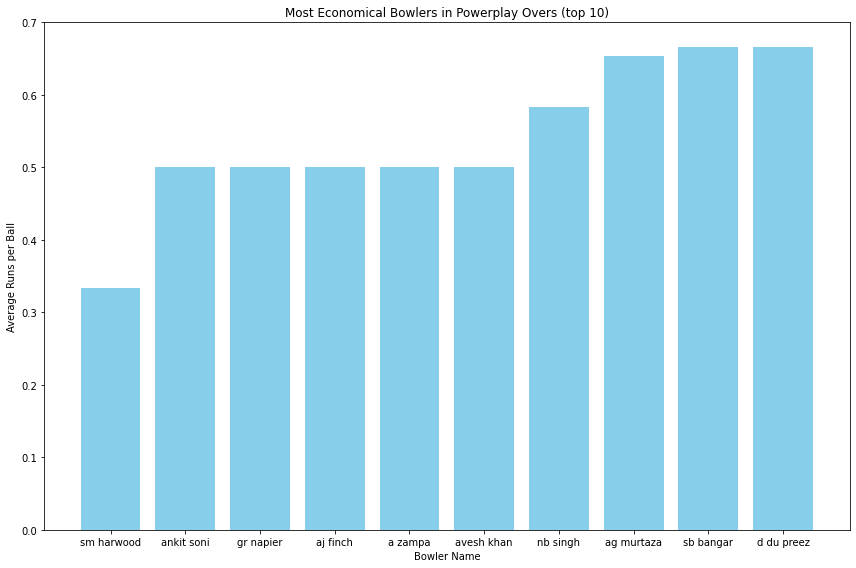

In [0]:
import matplotlib.pyplot as plt

# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))

# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color = 'skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (top 10)')
plt.tight_layout()
plt.show()

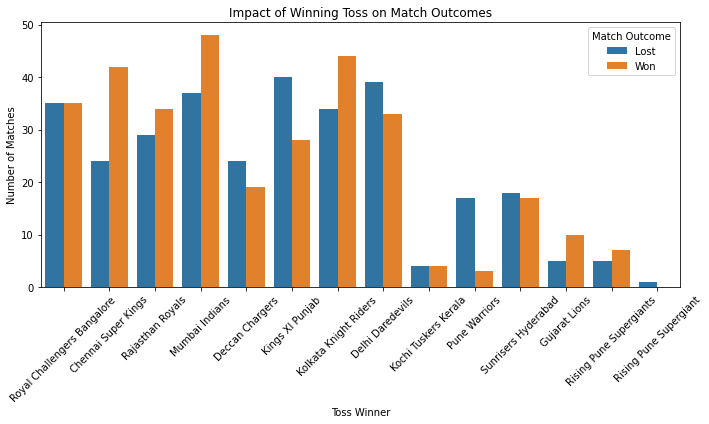

In [0]:
import seaborn as sns

toss_impact_pd = toss_impact_individual_matches.toPandas()

# Creating a countplot to show win/loss after winning toss
plt.figure(figsize=(10, 6) )
sns.countplot(x = 'toss_winner', hue='match_outcome', data = toss_impact_pd)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title = 'Match Outcome')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

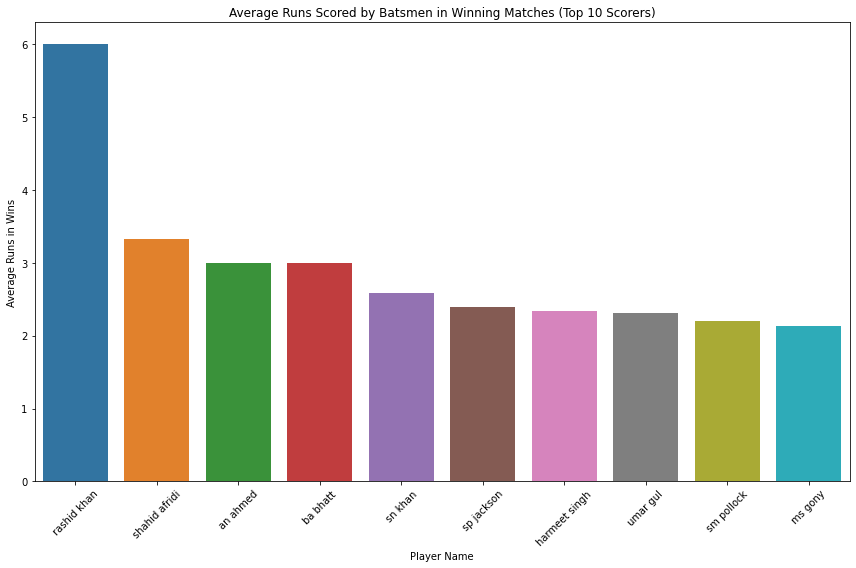

In [0]:
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [0]:
# Execute SQL Query
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match 
    ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")

# Displaying the row count till 10
# scores_by_venue.limit(10).display()

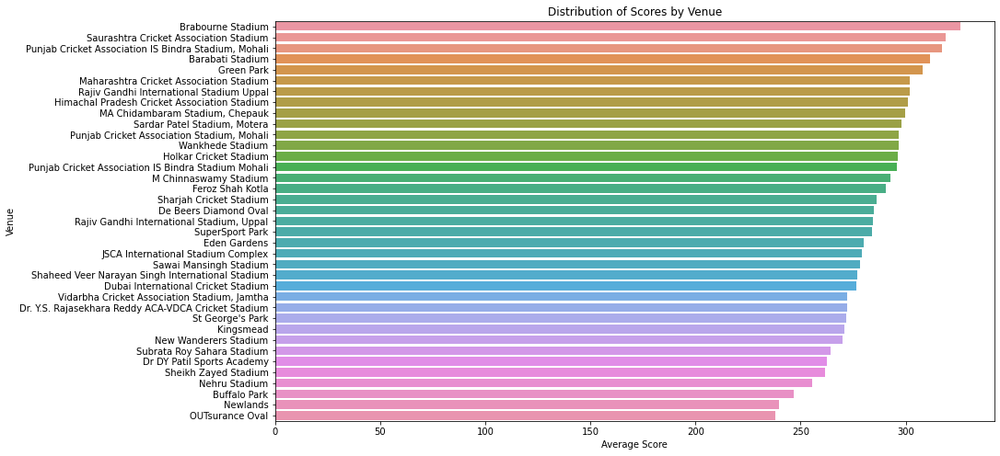

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()

In [0]:
# Execute SQL Query
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")

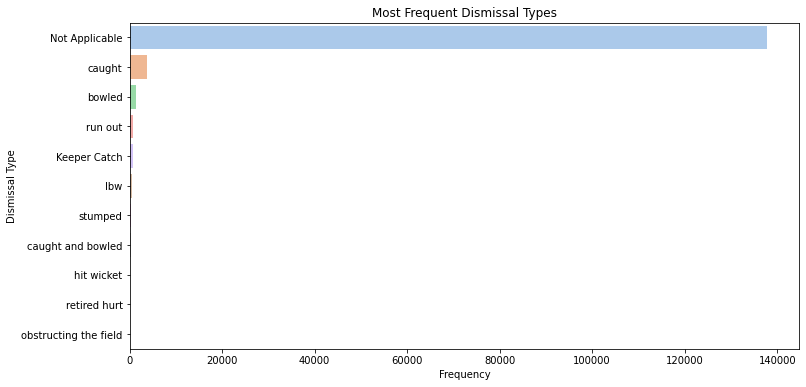

In [0]:
# Convert to Pandas DataFrame
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()

In [0]:
# Execute SQL Query
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")

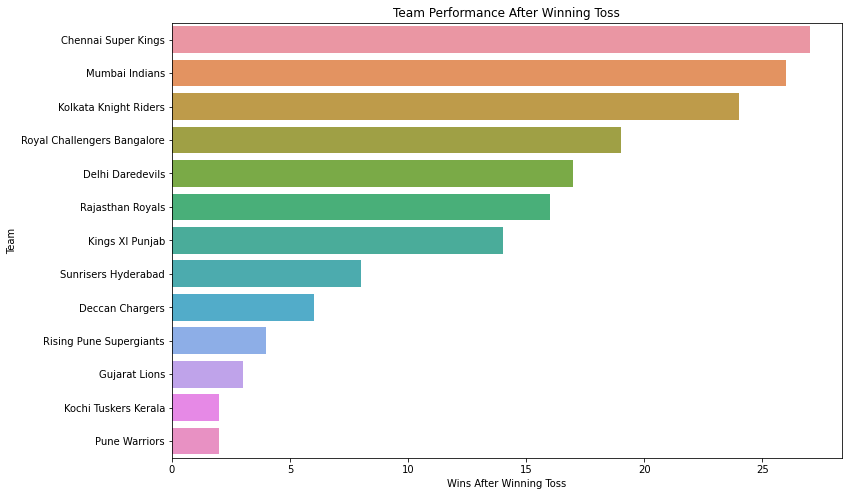

In [0]:
# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()
